# <u> Création curseur

In [1]:
import psycopg2

conn = psycopg2.connect(
    dbname="EPSI",
    user="postgres",
    password="Cacahuete1!",
    host="localhost"
)

# <u> Récupération des données

In [2]:
# Création d'un curseur
cur = conn.cursor()
#conn.autocommit = True

# Exécution de la requête SQL pour récupérer les données
cur.execute("SELECT * FROM mspr_data LIMIT 0")

# Récupération des noms de colonnes
columns = [desc[0] for desc in cur.description]

# Affichage des noms de colonnes
print(columns)
# Fermeture du curseur et de la connexion
cur.close()

['event_time', 'event_type', 'product_id', 'category_id', 'category_code', 'brand', 'price', 'user_id', 'user_session']


In [3]:
cur = conn.cursor()

#cur.execute("SELECT * FROM mspr_data WHERE event_type='purchase' ORDER BY RANDOM() LIMIT 1000")
cur.execute("SELECT * FROM mspr_data TABLESAMPLE SYSTEM(2)")

# Récupération du résultat
rows = cur.fetchall()

# Fermeture du curseur et de la connexion
cur.close()

conn.close()

In [4]:
import pandas as pd

df = pd.DataFrame(rows, columns=columns)

In [5]:
df.isna().sum() 

event_time             0
event_type             0
product_id             0
category_id            0
category_code    1569447
brand            1231400
price                  0
user_id                0
user_session           4
dtype: int64

In [6]:
"""df.fillna({
    'category_id': -1,
    'brand': 'unknown',
    'price': df['price'].mean()
}, inplace=True)"""

df.fillna({
    'category_code' : -1,
    'brand': 'unknown',
    'user_session' : -1
}, inplace=True)

# Suppression des doublons
df.drop_duplicates(inplace=True)

df['event_time'] = pd.to_datetime(df['event_time'])

df

,event_time,event_type,product_id,category_id,category_code,brand,price,user_id,user_session
0,2019-10-01 00:06:19,view,1004246,2053013555631882655,electronics.smartphone,apple,736.18,533940457,309e5dba-628b-491a-98ec-4c2906db831a
1,2019-10-01 00:06:19,view,34800153,2062461754293617058,-1,unknown,21.42,530659801,af7ed87b-e918-4b31-bd24-475be2c19a3a
2,2019-10-01 00:06:20,view,21400341,2053013561579406073,electronics.clocks,unknown,133.85,545463465,fec1fc7d-2796-43e3-800d-8d3d23adc0a5
3,2019-10-01 00:06:20,view,1004874,2053013555631882655,electronics.smartphone,samsung,383.51,519528062,901b9e3c-3f8f-4147-a442-c25d5c5ed332
4,2019-10-01 00:06:25,view,3700766,2053013565983425517,appliances.environment.vacuum,samsung,128.45,555448298,a4378fe7-5e6a-4b97-84ca-2cc8c9d4015f
...,...,...,...,...,...,...,...,...,...
9057847,2020-04-30 23:45:29,view,27200807,2232732112782361392,kids.swing,polaroid,69.50,627522988,8e7d87a7-0316-4828-a4d1-0a27c745139e
9057848,2020-04-30 23:45:29,view,26800086,2232732066611463064,-1,unknown,772.99,599176386,15249a3e-06ef-4c1b-895b-7c8a579aaf70
9057849,2020-04-30 23:45:29,view,100227723,2232732093077520756,construction.tools.light,samsung,360.09,649772284,d8aae7ea-fc96-43d7-b00d-64ac3bfa8ffd
9057850,2020-04-30 23:45:29,view,100062006,2053013551932506308,construction.tools.drill,adidas,65.69,588943123,9d192e39-daec-402a-bb4d-f211bc417dfb


In [7]:
df.isna().sum() 

event_time       0
event_type       0
product_id       0
category_id      0
category_code    0
brand            0
price            0
user_id          0
user_session     0
dtype: int64

In [8]:
df['user_id'].nunique()

3628700

# <u> Analyse des acheteurs

## <u> RFM

In [9]:
from datetime import datetime

purchase_df = df[df['event_type'] == 'purchase']

# Calcul des variables RFM
max_stamp = df['event_time'].max()

rfm_df = purchase_df.groupby('user_id').agg(
    recency=('event_time', lambda x: (max_stamp - x.max()).days),
    frequency=('event_time', 'count'),
    monetary=('price', 'sum')
).reset_index()

rfm_df

,user_id,recency,frequency,monetary
0,277964804,151,1,74.36
1,309352812,115,1,35.78
2,363037756,128,1,6.15
3,370187111,128,1,359.85
4,382634185,148,1,295.96
...,...,...,...,...
128733,649712807,0,1,64.33
128734,649730276,0,1,144.15
128735,649743532,0,1,143.89
128736,649763479,0,1,231.64


In [10]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_df[['recency', 'frequency', 'monetary']])

C:\Users\poire\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:110: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] Le fichier spécifié est introuvable
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\poire\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 199, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\poire\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\poire\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\poire\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(e

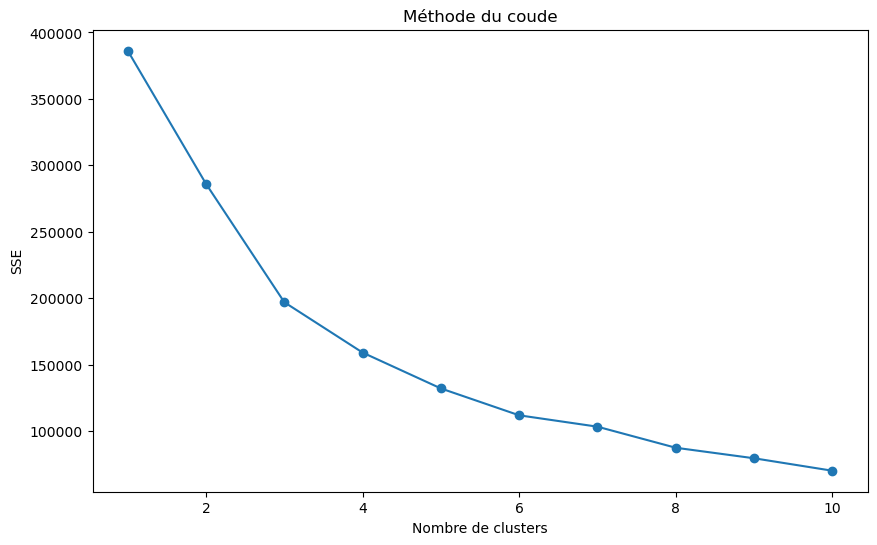

In [11]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init = 2)
    kmeans.fit(rfm_scaled)
    sse.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), sse, marker='o')
plt.xlabel('Nombre de clusters')
plt.ylabel('SSE')
plt.title('Méthode du coude')
plt.show()

In [12]:
optimal_clusters = 4
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42, n_init='auto')
rfm_df['cluster'] = kmeans.fit_predict(rfm_scaled)

rfm_df

,user_id,recency,frequency,monetary,cluster
0,277964804,151,1,74.36,1
1,309352812,115,1,35.78,1
2,363037756,128,1,6.15,1
3,370187111,128,1,359.85,1
4,382634185,148,1,295.96,1
...,...,...,...,...,...
128733,649712807,0,1,64.33,2
128734,649730276,0,1,144.15,2
128735,649743532,0,1,143.89,2
128736,649763479,0,1,231.64,2


# <u> Data session

In [13]:
session_features = df.groupby('user_session').agg(
    session_length=('event_time', lambda x: (x.max() - x.min()).total_seconds() / 60),
    num_views=('event_time', 'count'),
    num_categories=('category_code', pd.Series.nunique),
    total_price=('price', 'sum'),
    mean_price=('price', 'mean'),
    median_price=('price', 'median'),
    #most_frequent_brand=('brand', lambda x: x.mode()[0] if not x.mode().empty else 'unknown'),
    #most_frequent_product_id=('product_id', lambda x: x.mode()[0] if not x.mode().empty else 'unknown')
).reset_index()

session_features

,user_session,session_length,num_views,num_categories,total_price,mean_price,median_price
0,-1,106839.733333,4,2,1247.08,311.77,202.555
1,00000056-a206-40dd-b174-a072550fa38c,0.000000,1,1,717.64,717.64,717.640
2,00000083-8816-4d58-a9b8-f52f54186edc,0.000000,1,1,289.52,289.52,289.520
3,000005c4-64d7-42dd-8ecf-4f13460c813a,0.000000,1,1,41.23,41.23,41.230
4,000006f5-f793-4f74-a103-bb24a3cf2902,0.000000,1,1,861.80,861.80,861.800
...,...,...,...,...,...,...,...
7752015,fffff038-a8d6-4c8a-9bf3-afe71b52733a,0.000000,1,1,65.38,65.38,65.380
7752016,fffff6c6-9f11-42ef-96fa-2aa275a71590,0.000000,1,1,190.20,190.20,190.200
7752017,fffff956-3426-4d37-9de9-4c00ec4ddeac,15.683333,3,1,977.70,325.90,308.810
7752018,fffffd9c-1df1-496c-909e-900ac92dce5d,0.000000,1,1,14.76,14.76,14.760


In [14]:
df = df.merge(session_features, on='user_session', how='left')
session_features = []

In [15]:
df.sort_values(by='session_length', ascending=False)

,event_time,event_type,product_id,category_id,category_code,brand,price,user_id,user_session,session_length,num_views,num_categories,total_price,mean_price,median_price
5567645,2020-01-26 16:51:29,view,3700601,2232732101063475749,appliances.environment.vacuum,vitek,51.20,459349272,12614a38-fa1a-4143-9aa7-2b08c8be0a41,279429.1,9,6,1218.66,135.406667,51.20
4449405,2019-12-27 19:20:23,view,27700140,2232732113503781696,accessories.bag,unknown,33.95,459349272,12614a38-fa1a-4143-9aa7-2b08c8be0a41,279429.1,9,6,1218.66,135.406667,51.20
123455,2019-10-05 18:20:35,view,52900126,2139150089359196199,accessories.bag,stayer,14.67,459349272,12614a38-fa1a-4143-9aa7-2b08c8be0a41,279429.1,9,6,1218.66,135.406667,51.20
124366,2019-10-05 19:00:39,view,1307237,2053013558920217191,computers.notebook,lenovo,257.38,459349272,12614a38-fa1a-4143-9aa7-2b08c8be0a41,279429.1,9,6,1218.66,135.406667,51.20
124416,2019-10-05 19:04:19,view,1307237,2053013558920217191,computers.notebook,lenovo,257.38,459349272,12614a38-fa1a-4143-9aa7-2b08c8be0a41,279429.1,9,6,1218.66,135.406667,51.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3550617,2019-12-08 09:59:35,view,5100576,2232732103101907535,electronics.clocks,apple,492.16,512363960,3beea89e-050d-43df-bc8b-9428c8530698,0.0,1,1,492.16,492.160000,492.16
3550616,2019-12-08 09:59:35,view,4300149,2232732091483685190,-1,polaris,41.16,569546970,c5cdc503-c8e8-47c3-9fbe-7f0a1cb10426,0.0,1,1,41.16,41.160000,41.16
3550613,2019-12-08 09:59:35,cart,1005177,2232732093077520756,construction.tools.light,samsung,849.16,579364541,65a337bf-abe4-427f-a8d6-f2862704cda3,0.0,1,1,849.16,849.160000,849.16
3550612,2019-12-08 09:59:34,view,1801805,2232732099754852875,appliances.personal.massager,artel,242.45,583725229,9ee82efd-c41f-4204-adf7-d886756b9339,0.0,1,1,242.45,242.450000,242.45


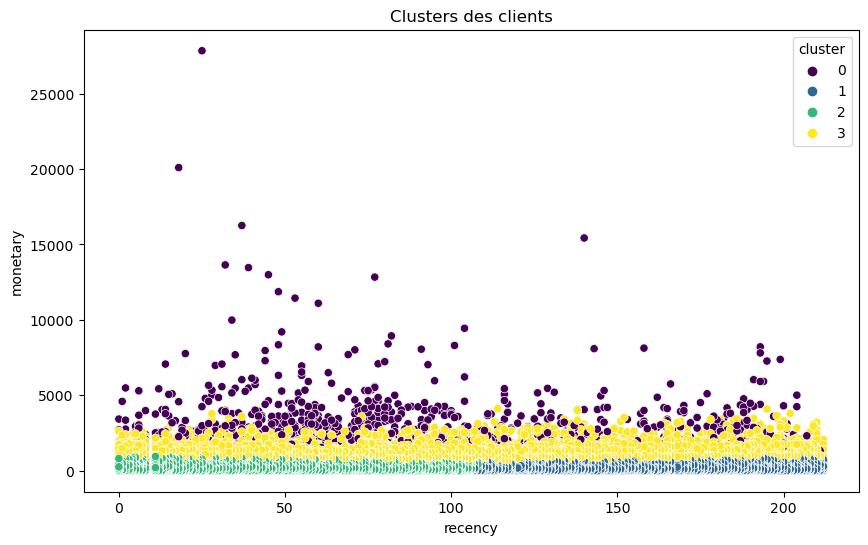

cluster     recency        frequency            monetary          
                 mean median      mean median         mean    median
0       0   90.066879   78.0  3.944904    3.0  1471.209745   993.035
1       1  164.380585  165.0  1.051989    1.0   202.164023   159.590
2       2   49.896447   51.0  1.078192    1.0   210.603333   167.660
3       3  111.800210  110.0  1.219027    1.0  1142.172591  1000.360

In [16]:
import seaborn as sns
import plotly.express as px

plt.figure(figsize=(10, 6))
sns.scatterplot(x='recency', y='monetary', hue='cluster', data=rfm_df, palette='viridis')
plt.title('Clusters des clients')
plt.show()


cluster_summary = rfm_df.groupby('cluster').agg({
    'recency': ['mean', 'median'],
    'frequency': ['mean', 'median'],
    'monetary': ['mean', 'median']
}).reset_index()


# Plot 3D
fig = px.scatter_3d(rfm_df, x='recency', y='frequency', z='monetary', color='cluster', title='Clusters des clients')
fig.show()

# Résumé des clusters
cluster_summary = rfm_df.groupby('cluster').agg({
    'recency': ['mean', 'median'],
    'frequency': ['mean', 'median'],
    'monetary': ['mean', 'median']
}).reset_index()

cluster_summary

In [17]:
cluster_dict = {
    0 : 'Moyen dépenseur',
    1 : 'Client avec achat ancien',
    2 : 'Gros dépenseurs',
    3 : 'Client avec achat récent'
}

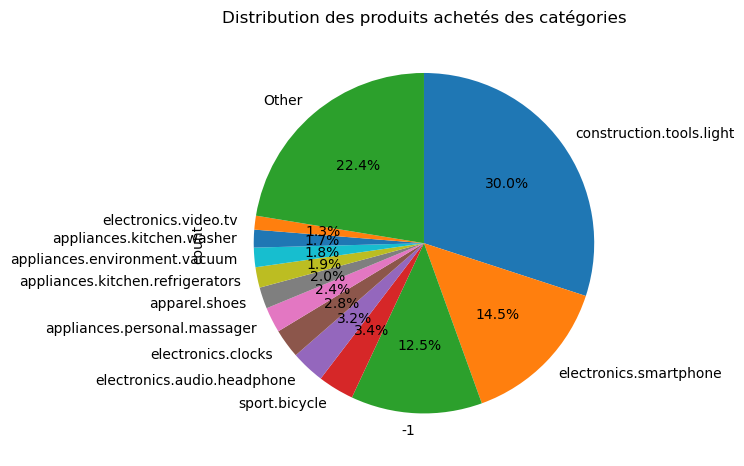

In [18]:
category_counts = purchase_df['category_code'].value_counts()

threshold = 0.01 * category_counts.sum()  # Par exemple, 5% du total

# Séparer les catégories importantes des autres
important_categories = category_counts[category_counts >= threshold]
other_categories = category_counts[category_counts < threshold].sum()

# Ajouter la catégorie "Other" pour les catégories moins importantes
if other_categories > 0:
    important_categories['Other'] = other_categories

# Créer le diagramme circulaire
fig, ax = plt.subplots()
important_categories.plot.pie(ax=ax, autopct='%1.1f%%', startangle=90, counterclock=False)

# Ajouter un titre
ax.set_title('Distribution des produits achetés des catégories')

# Afficher le diagramme
plt.tight_layout()
plt.show()

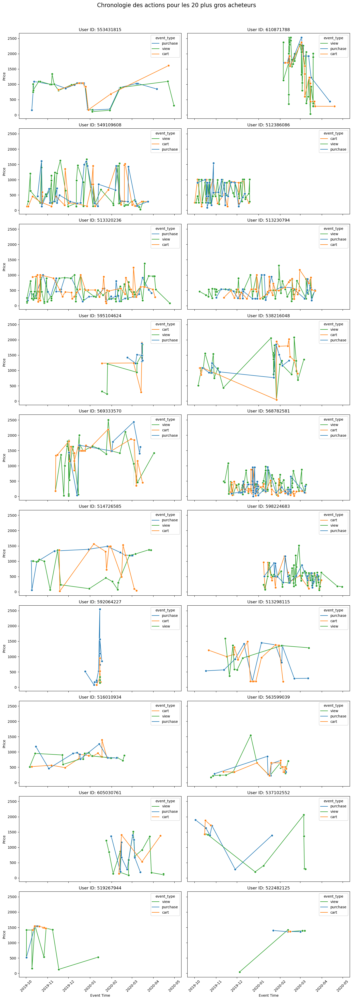

In [19]:
n = 20

# Identifier les n plus gros acheteurs
top_n_buyers = rfm_df.sort_values(by='monetary', ascending=False).head(n)['user_id']

# Récupérer les données associées aux n plus gros acheteurs
top_n_data = df[df['user_id'].isin(top_n_buyers)]

# Calculer le temps entre les différentes actions
top_n_data = top_n_data.sort_values(by=['user_id', 'event_time'])
top_n_data['time_diff'] = top_n_data.groupby('user_id')['event_time'].diff().fillna(pd.Timedelta(seconds=0))
top_n_data['time_diff_seconds'] = top_n_data['time_diff'].dt.total_seconds()

# Créer un subplot pour chaque utilisateur
fig, axes = plt.subplots(nrows=int(n / 2), ncols=2, figsize=(14, 40), sharex=True, sharey=True)
fig.suptitle(f'Chronologie des actions pour les {n} plus gros acheteurs', fontsize=16)
axes = axes.flatten()

event_colors = {'purchase': '#1f77b4', 'cart': '#ff7f0e', 'view': '#2ca02c'}

# Parcourir chaque utilisateur et créer le graphique correspondant
for i, user_id in enumerate(top_n_buyers):
    user_data = top_n_data[top_n_data['user_id'] == user_id]
    ax = axes[i]
    sns.lineplot(x='event_time', y='price', hue='event_type', data=user_data, palette=event_colors, marker='o', ax=ax)
    ax.set_title(f'User ID: {user_id}')
    ax.set_xlabel('Event Time')
    ax.set_ylabel('Price')
    ax.xaxis.set_tick_params(rotation=45)

# Ajuster et afficher le subplot
plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

### Répartition achats des clusters

In [20]:
for cluster in [0, 1, 2, 3]:
    
    data = purchase_history[purchase_history['cluster'] == cluster]['category_code'].value_counts()

    threshold = 0.01 * data.sum()  # Par exemple, 5% du total

    # Séparer les catégories importantes des autres
    important_categories = data[data >= threshold]
    other_categories = data[data < threshold].sum()

    # Ajouter la catégorie "Other" pour les catégories moins importantes
    if other_categories > 0:
        important_categories['Other'] = other_categories

    # Créer le diagramme circulaire
    fig, ax = plt.subplots()
    important_categories.plot.pie(ax=ax, autopct='%1.1f%%', startangle=90, counterclock=False)

    # Ajouter un titre
    ax.set_title(f'Distribution des produits achetés des catégories pour le cluster {cluster}\n{cluster_dict[cluster]}\nTaille cluster : {len(purchase_history[purchase_history.cluster == cluster])}')
    # Afficher le diagramme
    plt.tight_layout()
    plt.show()

NameError: name 'purchase_history' is not defined

In [ ]:
dat = df[df['category_code'] == 'construction.tools.light']
dat['brand'].unique(), dat['price'].describe()

# <u> Recommandations paniers validés 

In [23]:
import random


def recommend_products(user_id, product_data, purchase_history):
    cluster = purchase_history[purchase_history['user_id'] == user_id]['cluster'].values[0]
    user_history = purchase_history[(purchase_history['user_id'] == user_id) & (purchase_history['cluster'] == cluster)]

    #product + brand
    user_products = user_history['product_id'].unique()
    user_categories = user_history['category_code'].unique()

    similar_users = purchase_history[(purchase_history['cluster'] == cluster) & (purchase_history['product_id'].isin(user_products))]['user_id'].unique()

    similar_users_purchases = purchase_history[purchase_history['user_id'].isin(similar_users)]
    product_popularity = similar_users_purchases['product_id'].value_counts().reset_index()
    product_popularity.columns = ['product_id', 'popularity']

    recommendations = product_data[product_data['product_id'].isin(product_popularity['product_id']) & ~product_data['product_id'].isin(user_products)]
    recommendations = recommendations[~recommendations['category_code'].isin(user_categories)]
    
    recommendations = recommendations.merge(product_popularity, on='product_id', how='left')
    recommendations = recommendations.drop_duplicates(subset=['product_id'])

    # Scoring
    user_brands = user_history['brand'].unique()
    recommendations['same_brand'] = recommendations['brand'].isin(user_brands).astype(int)
    #Score custom, +50% de boost si la arque proposée et la marque achetée matchent
    recommendations['score'] = recommendations['popularity'] * (1 + 0.5 * recommendations['same_brand'])
    recommendations = recommendations.sort_values(by='score', ascending=False)
    
    return recommendations

product_data = df[['product_id', 'category_id', 'category_code', 'brand', 'price']].drop_duplicates()

purchase_history = purchase_df.merge(rfm_df[['user_id', 'cluster']], on='user_id', how='left')

# Exemple
user_id = random.choice(purchase_df['user_id'].unique())
print(user_id)

recommended_products = recommend_products(user_id, product_data, purchase_history)

user_items = purchase_history[(purchase_history['user_id'] == user_id)]

display(user_items)

recommended_products

607557632


,event_time,event_type,product_id,category_id,category_code,brand,price,user_id,user_session,cluster
89390,2020-01-29 06:44:34,purchase,5100816,2232732103831716449,apparel.shoes,xiaomi,26.72,607557632,ab6bea6a-42b7-4f1b-b2b4-46cb302c04c6,2


,product_id,category_id,category_code,brand,price,popularity,same_brand,score
0,1004767,2053013555631882655,electronics.smartphone,samsung,254.82,3,0,3.0
423,4804660,2053013554658804075,electronics.audio.headphone,unknown,0.00,3,0,3.0
4,4804056,2053013554658804075,electronics.audio.headphone,apple,161.98,2,0,2.0
19,5100846,2053013553341792533,electronics.clocks,xiaomi,180.16,1,1,1.5
659,100009754,2232732093077520756,construction.tools.light,xiaomi,238.82,1,1,1.5
167,27400054,2053013563391345499,-1,xiaomi,45.82,1,1,1.5
200,26400301,2053013563651392361,-1,lucente,187.65,1,0,1.0
201,1005212,2053013555631882655,electronics.smartphone,unknown,0.00,1,0,1.0
212,11200384,2053013562946749253,appliances.personal.scales,elenberg,11.56,1,0,1.0
265,13104856,2053013553526341921,-1,remain,258.44,1,0,1.0


# <u> Recommandations paniers non validés

In [24]:
def recommend_cart_abandon_products(user_id, product_data, purchase_history, cart_data):
    user_cart_products = cart_data[cart_data['user_id'] == user_id]['product_id'].unique()

    # Identifier les utilisateurs ayant ajouté au panier les mêmes produits
    similar_users = purchase_history[purchase_history['product_id'].isin(user_cart_products)]['user_id'].unique()

    # Obtenir les produits achetés par ces utilisateurs
    similar_users_purchases = purchase_history[purchase_history['user_id'].isin(similar_users)]
    product_popularity = similar_users_purchases['product_id'].value_counts().reset_index()
    product_popularity.columns = ['product_id', 'popularity']

    recommendations = product_data[product_data['product_id'].isin(product_popularity['product_id']) & ~product_data['product_id'].isin(user_cart_products)]
    recommendations = recommendations.merge(product_popularity, on='product_id', how='left')
    recommendations = recommendations.drop_duplicates(subset=['product_id'])

    #Score custom, +50% de boost si la arque proposée et la marque achetée matchent
    recommendations['score'] = recommendations['popularity'] * (1 + 0.5 * recommendations['same_brand'])
    recommendations = recommendations.sort_values(by='score', ascending=False)
    
    return recommendations

# Exemple
cart_data = df[df['event_type'] == 'view']
user_id = random.choice(cart_data['user_id'].unique())

recommended_cart_abandon_products = recommend_cart_abandon_products(user_id, product_data, purchase_history, cart_data)

display(cart_data[(cart_data['user_id'] == user_id)])
recommended_cart_abandon_products

KeyError: 'same_brand'